## Import Necessary Libraries

In [1]:
import numpy as np  
import pandas as pd  
import matplotlib.pyplot as plt
import seaborn as sns 
import re 
from nltk.corpus import stopwords  
import re
import os
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
nltk.download('punkt')
stemmer = PorterStemmer()


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/ramyasritellakula/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## Data Loading

In [2]:
# Load the resume dataset
df = pd.read_csv("/Users/ramyasritellakula/Downloads/resume_dataset/Resume/Resume.csv")

## Data Preprocessing and Cleaning

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   ID           2484 non-null   int64 
 1   Resume_str   2484 non-null   object
 2   Resume_html  2484 non-null   object
 3   Category     2484 non-null   object
dtypes: int64(1), object(3)
memory usage: 77.8+ KB


In [4]:
df.shape

(2484, 4)

In [5]:
df.sample(10)

,ID,Resume_str,Resume_html,Category
354,19464810,TEACHER Professional Summary ...,"<div class=""fontsize fontface vmargins hmargin...",TEACHER
667,27937592,NEW BUSINESS DEVELOPMENT MANAGER ...,"<div class=""fontsize fontface vmargins hmargin...",BUSINESS-DEVELOPMENT
356,13855004,TEACHER Professional Summary T...,"<div class=""fontsize fontface vmargins hmargin...",TEACHER
666,36170003,BUSINESS DEVELOPMENT MANAGER Su...,"<div class=""fontsize fontface vmargins hmargin...",BUSINESS-DEVELOPMENT
724,16121387,MEDICAL RECORD TECHNICIAN Pro...,"<div class=""fontsize fontface vmargins hmargin...",HEALTHCARE
1774,22605864,SOFTWARE ENGINEERING TEAM LEAD ...,"<div class=""fontsize fontface vmargins hmargin...",ENGINEERING
1654,25142074,ADMINISTRATIVE ASSISTANT Prof...,"<div class=""MPR skn-cbg1 fontsize fontface vma...",APPAREL
2259,18369400,ASSISTANT BOY'S BASKETBALL COACH ...,"<div class=""fontsize fontface vmargins hmargin...",BANKING
2251,25200253,BANK OPERATIONS ANALYST Summary...,"<div class=""fontsize fontface vmargins hmargin...",BANKING
859,29165698,GENERAL MANAGER Summary ...,"<div class=""fontsize fontface vmargins hmargin...",FITNESS


In [6]:
#Check for missing values in each column
print(df.isnull().sum())

ID             0
Resume_str     0
Resume_html    0
Category       0
dtype: int64


In [7]:
#Drop unused columns
df.pop('ID')
df.head()

,Resume_str,Resume_html,Category
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR
1,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR
2,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR
3,HR SPECIALIST Summary Dedica...,"<div class=""fontsize fontface vmargins hmargin...",HR
4,HR MANAGER Skill Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR


In [8]:
#Drop unused columns
df.pop('Resume_html')
df.head()

,Resume_str,Category
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,HR
1,"HR SPECIALIST, US HR OPERATIONS ...",HR
2,HR DIRECTOR Summary Over 2...,HR
3,HR SPECIALIST Summary Dedica...,HR
4,HR MANAGER Skill Highlights ...,HR


In [9]:
#Check for missing values in each column
print(df.isnull().sum())


Resume_str    0
Category      0
dtype: int64


In [10]:
#Remove duplicate rows to avoid redundancy in the dataset
df = df.drop_duplicates()

In [11]:
#Clean the 'Resume_str' and 'Category' columns by stripping leading and trailing whitespace
df['Resume_str'] = df['Resume_str'].str.strip()
df['Category'] = df['Category'].str.strip()


In [12]:
# Function to preprocess resumes by removing unwanted elements (URLs, emails, etc.)
def preprocess(text):
    text = text.lower()
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    email_pattern = re.compile(r'\b[A-Za-z0-9._%+-]+@[A-Za-z0-9.-]+\.[A-Z|a-z]{2,}\b')
    
    # Remove URLs
    clean_text = url_pattern.sub('', text)
    
    # Remove emails
    clean_text = email_pattern.sub('', clean_text)
    
    # Remove special characters (keeping only words and whitespace)
    #clean_text = re.sub(r'[^\w\s]', '', clean_text)
    clean_text = re.sub('[^a-zA-Z]', ' ', text)
    
    # Remove stop words by filtering the split words of the text
    stop_words = set(stopwords.words('english'))
    clean_text = ' '.join(word for word in clean_text.split() if word.lower() not in stop_words)

    return clean_text

In [13]:
#Text before cleaning
df_before = df['Resume_str'][1]
print(df_before)

HR SPECIALIST, US HR OPERATIONS       Summary     Versatile  media professional with background in Communications, Marketing, Human Resources and Technology.         Experience     09/2015   to   Current     HR Specialist, US HR Operations    Company Name   －   City  ,   State       Managed communication regarding launch of Operations group, policy changes and system outages      Designed standard work and job aids to create comprehensive training program for new employees and contractors         Audited job postings for old, pending, on-hold and draft positions.           Audited union hourly, non-union hourly and salary background checks and drug screens             Conducted monthly new hire benefits briefing to new employees across all business units               Served as a link between HR Managers and vendors by handling questions and resolving system-related issues         Provide real-time process improvement feedback on key metrics and initiatives  Successfully re-branded US 

In [14]:
# preprocessing text
df['Resume'] = df['Resume_str'].apply(lambda w: preprocess(w))

In [15]:
#Text after cleaning
df_after = df['Resume'][1]
print(df_after)

hr specialist us hr operations summary versatile media professional background communications marketing human resources technology experience current hr specialist us hr operations company name city state managed communication regarding launch operations group policy changes system outages designed standard work job aids create comprehensive training program new employees contractors audited job postings old pending hold draft positions audited union hourly non union hourly salary background checks drug screens conducted monthly new hire benefits briefing new employees across business units served link hr managers vendors handling questions resolving system related issues provide real time process improvement feedback key metrics initiatives successfully branded us hr operations sharepoint site business unit project manager rfi rfp background check drug screen vendor marketing communications co op company name city state posted new articles changes updates corporate sharepoint site inc

In [16]:
def highlight_removed_words(before_text, after_text):
    before_words = before_text.split()
    after_words = after_text.split()

    highlighted_before = []
    for word in before_words:
        if word.lower() not in after_words:
            # Highlight removed words with red background
            highlighted_before.append(f"<span style='background-color:lightcoral;'>{word}</span>")
        else:
            # Optional: Highlight unchanged words with green background
            highlighted_before.append(f"<span style='background-color:lightgreen;'>{word}</span>")
    
    return ' '.join(highlighted_before)

# Highlight the removed words
highlighted_before_text = highlight_removed_words(df_before, df_after)


In [17]:
html_content = f"""
<div style="display: flex; justify-content: space-between; font-family: Arial, sans-serif;">
    <div style="width: 48%; padding-right: 10px;">
        <h3>Before Cleaning</h3>
        <p>{highlighted_before_text}</p>
    </div>
    <div style="width: 48%; padding-left: 10px;">
        <h3>After Cleaning</h3>
        <p>{df_after}</p>
    </div>
</div>
"""
# Display the result as an HTML output
from IPython.display import display, HTML
display(HTML(html_content))

## Exploratory Data Analysis (EDA)

In [18]:
df.head()

,Resume_str,Category,Resume
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\n\nHR ADM...,HR,hr administrator marketing associate hr admini...
1,"HR SPECIALIST, US HR OPERATIONS Summary ...",HR,hr specialist us hr operations summary versati...
2,HR DIRECTOR Summary Over 20 years e...,HR,hr director summary years experience recruitin...
3,"HR SPECIALIST Summary Dedicated, Driv...",HR,hr specialist summary dedicated driven dynamic...
4,HR MANAGER Skill Highlights ...,HR,hr manager skill highlights hr skills hr depar...


In [19]:
#Drop original text column
df.pop('Resume_str')
df.head()

,Category,Resume
0,HR,hr administrator marketing associate hr admini...
1,HR,hr specialist us hr operations summary versati...
2,HR,hr director summary years experience recruitin...
3,HR,hr specialist summary dedicated driven dynamic...
4,HR,hr manager skill highlights hr skills hr depar...


In [20]:
print("Basic Data Information:")
print(df.info())
print("\nSample Data:\n", df.head())

Basic Data Information:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2482 entries, 0 to 2482
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  2482 non-null   object
 1   Resume    2482 non-null   object
dtypes: object(2)
memory usage: 122.7+ KB
None

Sample Data:
   Category                                             Resume
0       HR  hr administrator marketing associate hr admini...
1       HR  hr specialist us hr operations summary versati...
2       HR  hr director summary years experience recruitin...
3       HR  hr specialist summary dedicated driven dynamic...
4       HR  hr manager skill highlights hr skills hr depar...


In [21]:
# Check for null values
print("\nChecking for missing values:")
print(df.isnull().sum())


Checking for missing values:
Category    0
Resume      0
dtype: int64


### Word Count Analysis

In [22]:
# Word Count Analysis
def word_count(text):
    words = text.split()
    return len(words)

# Apply word count function to the resumes
df['word_count'] = df['Resume'].apply(word_count)

# Display word count statistics (mean, min, max, etc.)
print("\nWord count statistics:")
print(df['word_count'].describe())


Word count statistics:
count    2482.000000
mean      593.478646
std       266.668090
min         0.000000
25%       482.000000
50%       554.000000
75%       682.000000
max      3581.000000
Name: word_count, dtype: float64


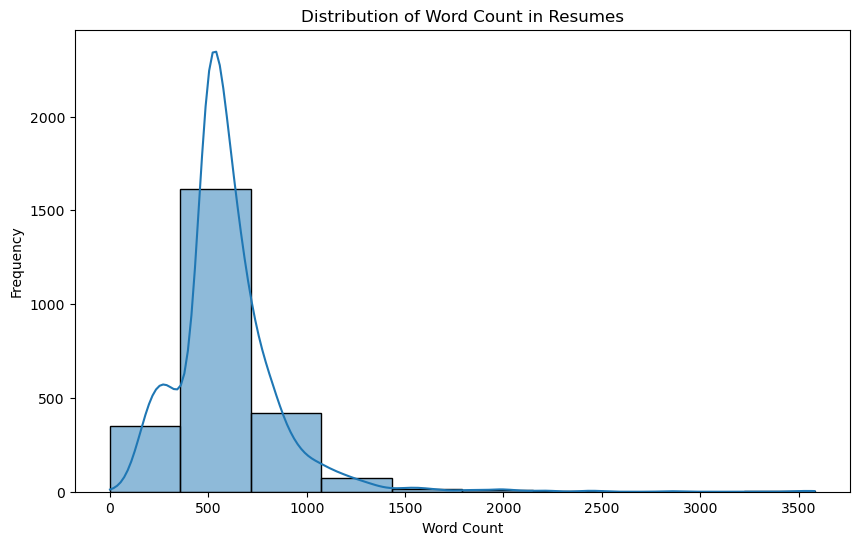

In [23]:
# Plot word count distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['word_count'], bins=10, kde=True)
plt.title("Distribution of Word Count in Resumes")
plt.xlabel("Word Count")
plt.ylabel("Frequency")
plt.show()

###  Category Distribution

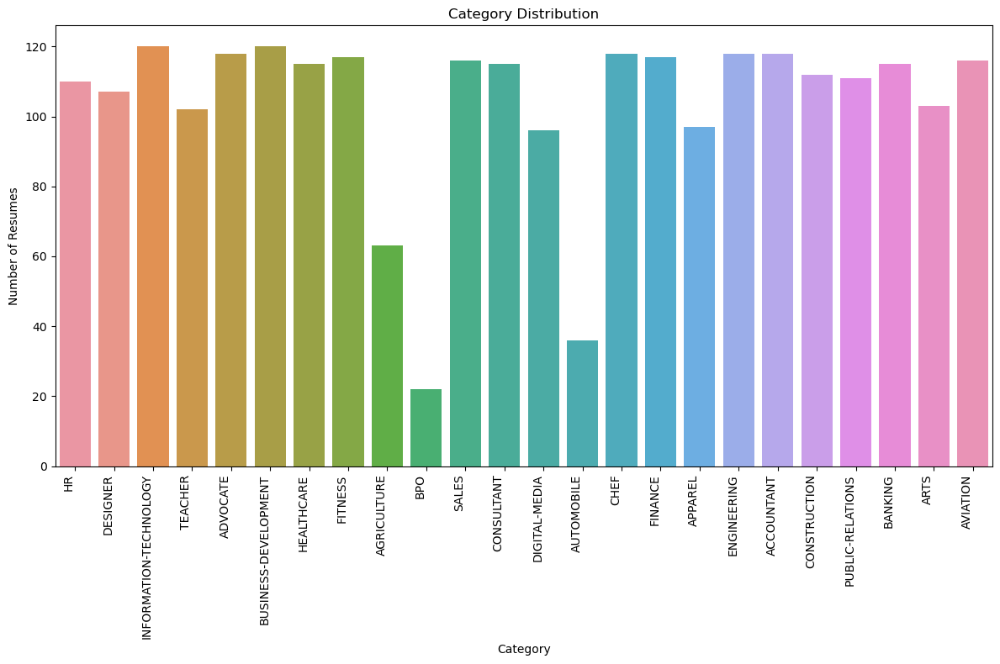

In [24]:

plt.figure(figsize=(12, 8))  
sns.countplot(data=df, x='Category')


plt.xticks(rotation=90, ha='right')

# Add a title and labels
plt.title("Category Distribution")
plt.xlabel("Category")
plt.ylabel("Number of Resumes")


plt.tight_layout()

# Show the plot
plt.show()


In [25]:
# create list of all categories
categories = np.sort(df['Category'].unique())
categories

array(['ACCOUNTANT', 'ADVOCATE', 'AGRICULTURE', 'APPAREL', 'ARTS',
       'AUTOMOBILE', 'AVIATION', 'BANKING', 'BPO', 'BUSINESS-DEVELOPMENT',
       'CHEF', 'CONSTRUCTION', 'CONSULTANT', 'DESIGNER', 'DIGITAL-MEDIA',
       'ENGINEERING', 'FINANCE', 'FITNESS', 'HEALTHCARE', 'HR',
       'INFORMATION-TECHNOLOGY', 'PUBLIC-RELATIONS', 'SALES', 'TEACHER'],
      dtype=object)

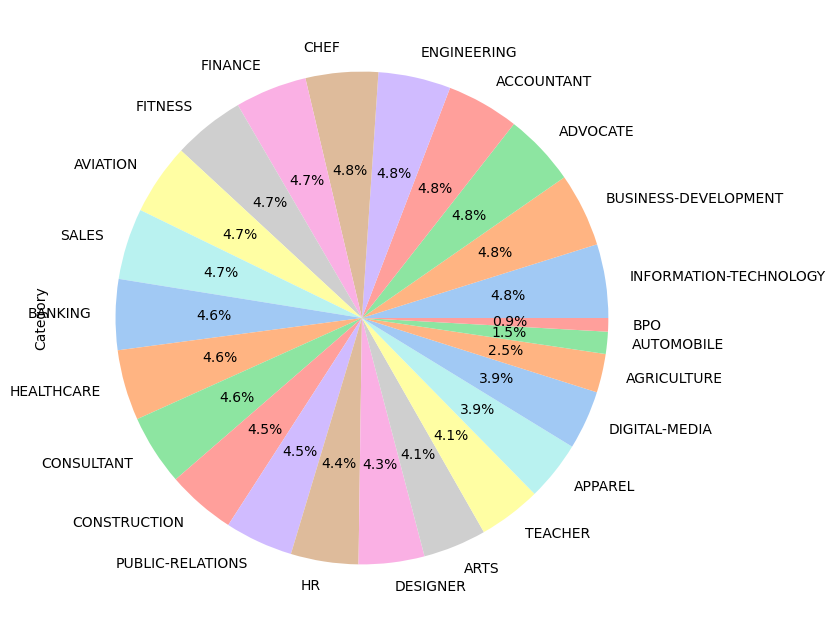

In [26]:
# Define a custom color palette
custom_palette = sns.color_palette("pastel")

# Plot the pie chart with the custom color palette
plt.figure(figsize=(8, 8))
df['Category'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=custom_palette)
plt.xticks(rotation=90)
plt.show()

In [27]:
df["Category"].value_counts()

INFORMATION-TECHNOLOGY    120
BUSINESS-DEVELOPMENT      120
ADVOCATE                  118
ACCOUNTANT                118
ENGINEERING               118
CHEF                      118
FINANCE                   117
FITNESS                   117
AVIATION                  116
SALES                     116
BANKING                   115
HEALTHCARE                115
CONSULTANT                115
CONSTRUCTION              112
PUBLIC-RELATIONS          111
HR                        110
DESIGNER                  107
ARTS                      103
TEACHER                   102
APPAREL                    97
DIGITAL-MEDIA              96
AGRICULTURE                63
AUTOMOBILE                 36
BPO                        22
Name: Category, dtype: int64

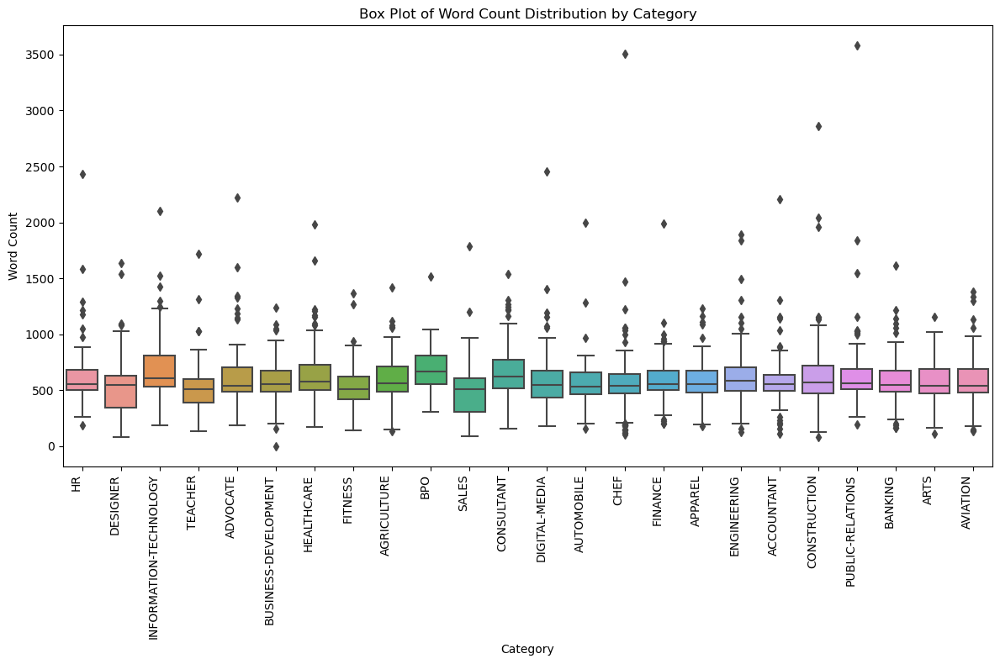

In [39]:
# Plot a box plot of word counts by category
plt.figure(figsize=(12, 8))

# Box plot of word counts grouped by category
sns.boxplot(x='Category', y='word_count', data=df)

# Add title and labels
plt.title("Box Plot of Word Count Distribution by Category")
plt.xlabel("Category")
plt.ylabel("Word Count")

# Rotate x-axis labels for better readability
plt.xticks(rotation=90, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


### Topic Modeling with BERTopic

In [41]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import pandas as pd

# Assuming the dataframe is named df with columns 'resume' and 'category'
resumes = df['Resume'].tolist()

# Load a sentence-transformers pre-trained model for embeddings
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')  # Or any other pre-trained model

# Create and fit BERTopic model with the custom embedding model
topic_model = BERTopic(embedding_model=embedding_model)
topics, probabilities = topic_model.fit_transform(resumes)

In [59]:
# Retrieve topic information and the representative words for each topic
topic_info = topic_model.get_topic_info()
data = []

# Collect the topic ID, top representative words, and their frequency
for topic_id in topic_info['Topic']:
    if topic_id != -1:  # Exclude the outlier topic (-1)
        # Get the top 5 words for each topic
        topic_words = topic_model.get_topic(topic_id)
        topic_name = ', '.join([word[0] for word in topic_words[:5]])  # Get the top 5 words
        frequency = topic_info[topic_info['Topic'] == topic_id]['Count'].values[0]  # Get frequency of the topic
        
        # Append data for the table
        data.append([topic_id, topic_name, frequency])

# Create a DataFrame to display the table
topic_table = pd.DataFrame(data, columns=['Topic ID', 'Top Words', 'Frequency'])

# Display the table
print(topic_table)


    Topic ID                                          Top Words  Frequency
0          0   accounting, financial, accounts, accountant, tax        211
1          1       students, teacher, student, learning, school        166
2          2           hr, employee, human, benefits, employees        136
3          3         medical, patient, health, care, healthcare        111
4          4                food, chef, kitchen, culinary, menu        110
5          5      construction, project, projects, site, safety         87
6          6       office, management, company, customer, state         79
7          7      fitness, exercise, wellness, health, personal         69
8          8        network, windows, software, server, systems         69
9          9  business, consultant, management, server, windows         63
10        10  aviation, aircraft, maintenance, flight, training         61
11        11            customers, sales, customer, store, cash         59
12        12       custom

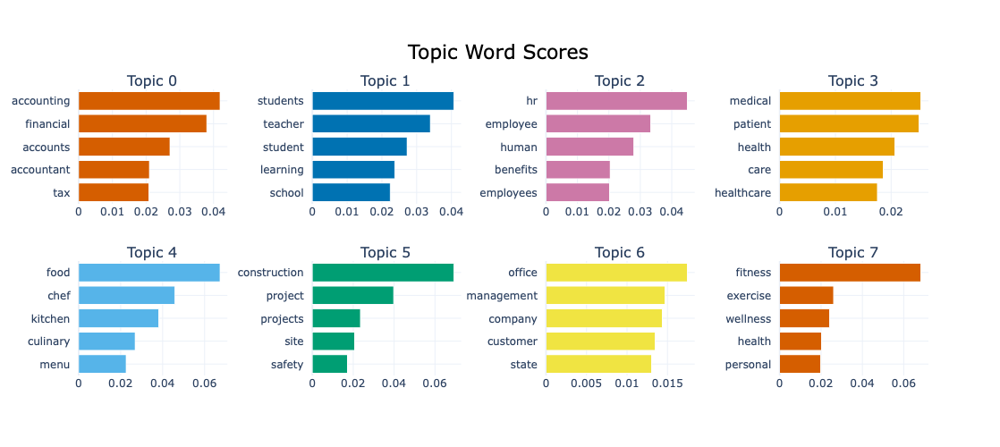

In [60]:
#Visualize the bar chart for topic frequencies
topic_model.visualize_barchart()

In [61]:
df_categories = [df[df['Category'] == category].loc[:, ['Resume', 'Category']] for category in categories]
df_categories[10]

,Resume,Category
1357,chef career focus nursing student recently obt...,CHEF
1358,chef summary customer oriented fast food worke...,CHEF
1359,chef career overview dedicated customer servic...,CHEF
1360,chef summary experienced catering chef skilled...,CHEF
1361,rm roxanne mejia summary motivating chef compe...,CHEF
...,...,...
1470,owner chef summary chef years critically accla...,CHEF
1471,kindergarten teacher professional summary ener...,CHEF
1472,substitute para professional summary professio...,CHEF
1473,executive chef partner summary proven abilitie...,CHEF


### Generate Word Clouds for each Category

In [62]:
def wordcloud(df):
    txt = ' '.join(txt for txt in df['Resume'])
    wordcloud = WordCloud(
        height=2000,
        width=4000,
        colormap=WORDCLOUD_COLOR_MAP
    ).generate(txt)

    return wordcloud

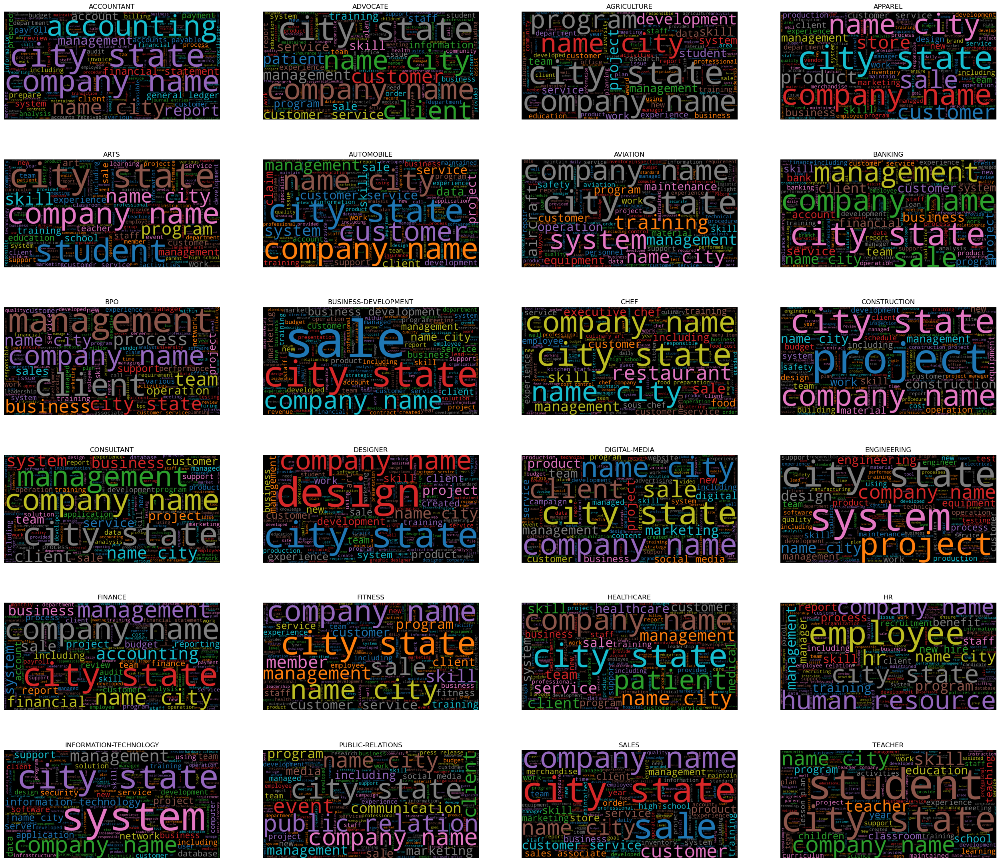

In [47]:
from wordcloud import WordCloud
plt.figure(figsize=(32, 28))
WORDCLOUD_COLOR_MAP = 'tab10_r'

for i, category in enumerate(categories):
    wc = wordcloud(df_categories[i])

    plt.subplot(6, 4, i + 1).set_title(category)
    plt.imshow(wc)
    plt.axis('off')
    plt.plot()

plt.show()
plt.close()

In [63]:
del_words = ['a','name', 'city', 'state', 'country', 'fullname', 'company', 'resume', 'curriculum vitae', 'address', 'phone',
             'email', 'linkedin', 'profile', 'summary', 'objective', 'experience', 'education', 'skill', 'skills',
             'reference', 'references', 'contact', 'detail', 'details', 'mail', 'gmail', 'yahoo', 'hotmail', 'mailing',
             'linkedin', 'twitter', 'facebook', 'instagram', 'website', 'web', 'url', 'www', 'year']

### Generate a Word Cloud with Filtered Words

In [64]:
import string
import nltk
from nltk.corpus import stopwords

# Define stop words including punctuation and custom deletion words
stop_words = set(stopwords.words('english') + ['``', "''"] + del_words)

total_words = []
sentences = df['Resume'].values
cleaned_sentences = ""

for sentence in sentences:
    cleaned_sentences += sentence
    required_words = nltk.word_tokenize(sentence)
    for word in required_words:
        if word not in stop_words and word not in string.punctuation:
            total_words.append(word)


In [65]:
word_freq_fist = nltk.FreqDist(total_words)
most_freq = word_freq_fist.most_common(50)
print(most_freq)


[('management', 12170), ('sales', 8275), ('customer', 7924), ('business', 7864), ('new', 6408), ('service', 6219), ('team', 6072), ('development', 5731), ('training', 5634), ('project', 5362), ('work', 4812), ('manager', 4534), ('information', 4502), ('marketing', 4489), ('financial', 4220), ('office', 4180), ('support', 4122), ('including', 4045), ('staff', 3948), ('professional', 3855), ('data', 3796), ('system', 3695), ('systems', 3556), ('university', 3475), ('managed', 3430), ('process', 3427), ('customers', 3416), ('design', 3384), ('quality', 3365), ('client', 3272), ('clients', 3244), ('developed', 3228), ('reports', 3083), ('analysis', 3050), ('operations', 3008), ('product', 2951), ('high', 2950), ('program', 2934), ('services', 2846), ('accounting', 2831), ('microsoft', 2828), ('current', 2787), ('accounts', 2774), ('maintained', 2773), ('responsible', 2717), ('software', 2644), ('procedures', 2547), ('time', 2537), ('planning', 2532), ('school', 2529)]


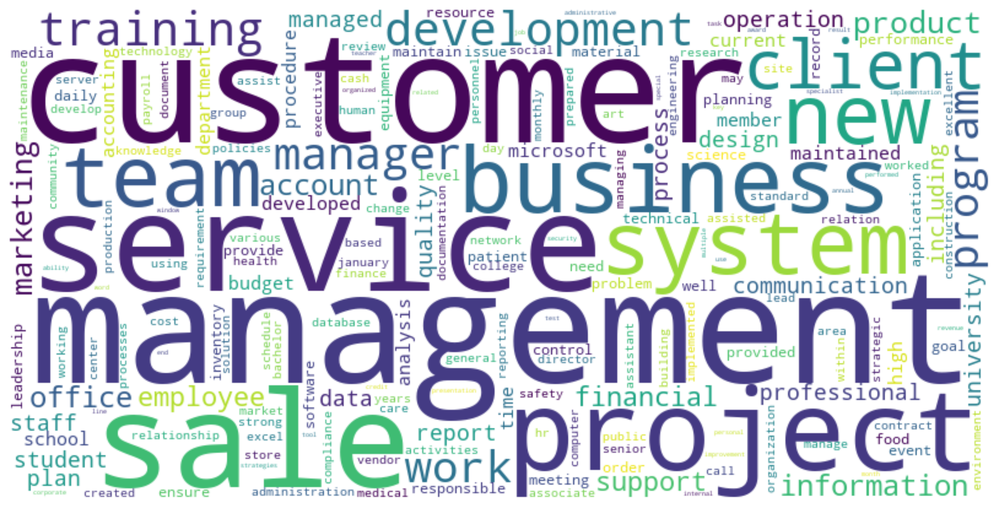

In [66]:
# Generate word cloud excluding unused words
wc = WordCloud(collocations=False, width=800, height=400, background_color='white').generate(' '.join(total_words))

# Plot word cloud
plt.figure(figsize=(12, 6), dpi=300)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()

### Word Frequency Analysis by Category

In [67]:
def wordfreq(df, del_words):
    # Split the resume text, count word frequencies, and reset index
    count = df['Resume'].str.split(expand=True).stack().value_counts().reset_index()
    count.columns = ['Word', 'Frequency']
    
    # Filter out the unused words
    count = count[~count['Word'].isin(del_words)]
    
    return count.head(10)


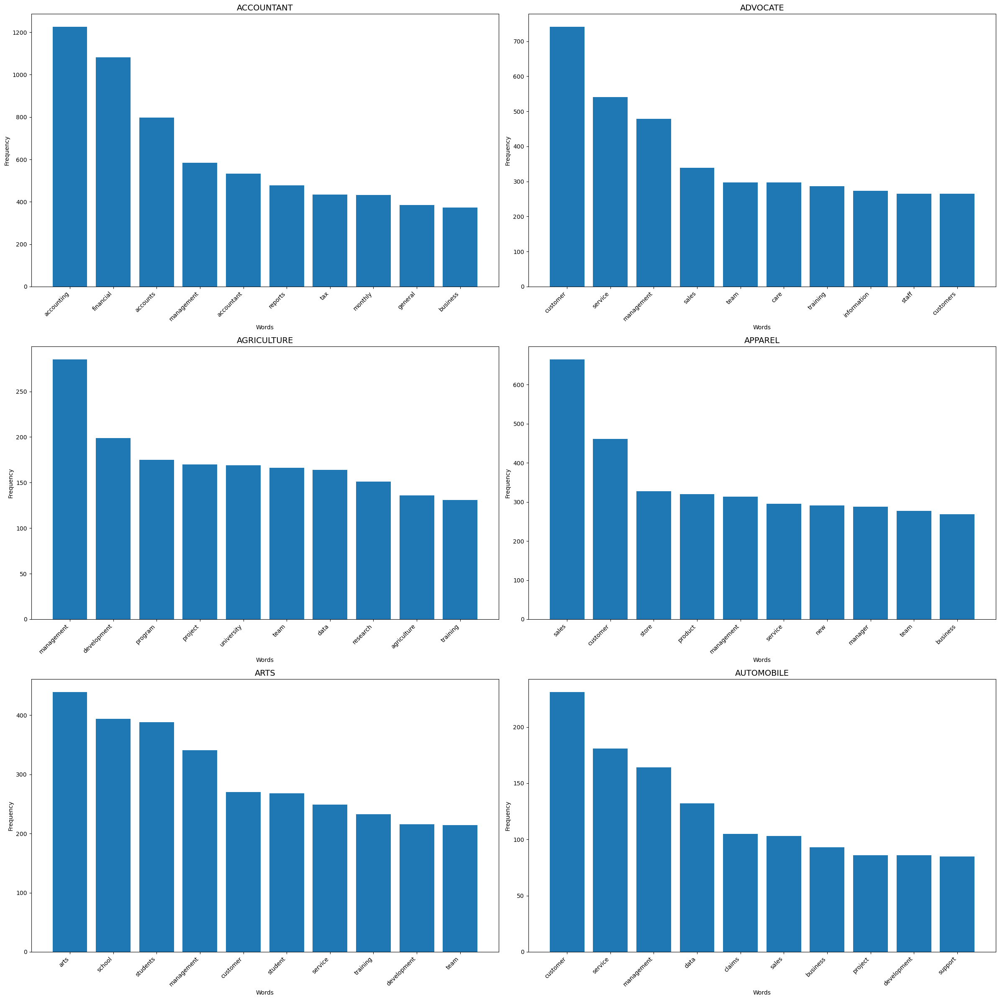

In [75]:
# Create the figure for subplots, adjusting size for 6 charts
fig = plt.figure(figsize=(24, 24))

# Loop through the first 6 categories and create bar plots
for i, category in enumerate(categories[:6]):  # Limiting to top 6 categories
    wf = wordfreq(df_categories[i], del_words)
    ax = fig.add_subplot(3, 2, i + 1)  # 3 rows, 2 columns for 6 charts
    
    # Create bar plot with default colors
    ax.bar(wf['Word'], wf['Frequency'])
    
    # Set title and axis labels
    ax.set_title(category, fontsize=14)
    ax.set_xticklabels(wf['Word'], rotation=45, ha="right")
    ax.set_xlabel('Words')
    ax.set_ylabel('Frequency')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


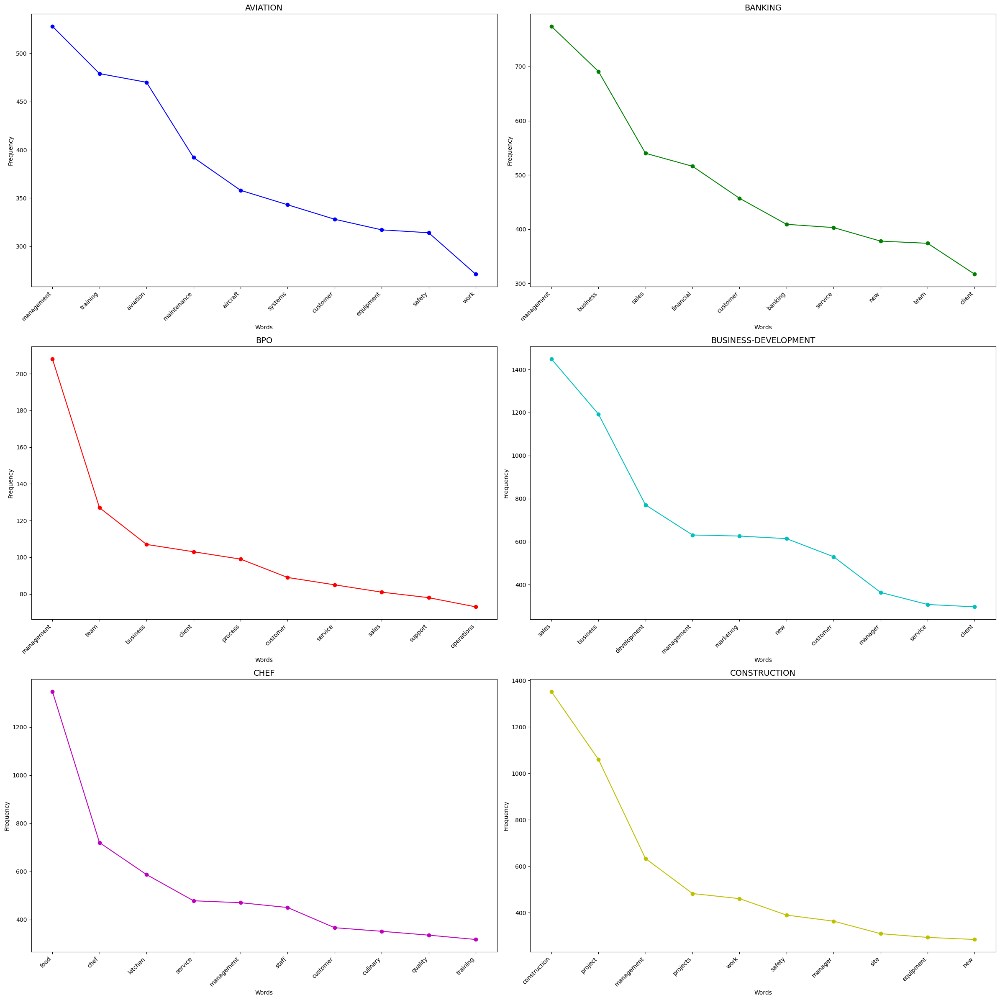

In [77]:
# Define a list of colors for each line plot
colors = ['b', 'g', 'r', 'c', 'm', 'y']

# Create the figure for subplots, adjusting size for 6 line plots
fig = plt.figure(figsize=(24, 24))

# Loop through the next 6 categories (categories 7 to 12) and create line plots
for i, category in enumerate(categories[6:12]):  # Limiting to categories 7 to 12
    wf = wordfreq(df_categories[i + 6], del_words)  # Offset to start from category 7
    ax = fig.add_subplot(3, 2, i + 1)  # 3 rows, 2 columns for 6 charts
    
    # Create line plot with varying colors from the list
    ax.plot(wf['Word'], wf['Frequency'], marker='o', linestyle='-', color=colors[i])
    
    # Set title and axis labels
    ax.set_title(category, fontsize=14)
    ax.set_xticklabels(wf['Word'], rotation=45, ha="right")
    ax.set_xlabel('Words')
    ax.set_ylabel('Frequency')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()
